In [54]:
#Uncomment the lines below to install geopandas dependencies package

!pip install 'geopandas[all]' --quiet


## **Fetching data files**

In [55]:
%%bash
set -euo pipefail

REPO_ZIP_URL="https://github.com/UCB-urban-data101/classActivity_data/archive/refs/heads/main.zip"
TMP_DIR="$(mktemp -d)"

# Prefer wget, otherwise curl
if command -v wget >/dev/null 2>&1; then
  wget -q -O "$TMP_DIR/repo.zip" "$REPO_ZIP_URL"
else
  curl -L -s -o "$TMP_DIR/repo.zip" "$REPO_ZIP_URL"
fi

unzip -oq "$TMP_DIR/repo.zip" -d "$TMP_DIR"
SRC_DIR="$TMP_DIR/classActivity_data-main"

rm -rf data
cp -R "$SRC_DIR/data" .

rm -rf "$TMP_DIR"
echo "Fetch complete."

Fetch complete.


# **Geospatial Vector Data in Python**

`Geopandas` provides an easy-to-use interface to vector datasets. It combines the capabilities of `pandas`, with the geometry handling functionality of `shapely`, the geo-spatial file format support of `fiona` and the map projection libraries of `pyproj`.

The main data structures in geopandas are `GeoDataFrames` and `GeoSeries`. They extend the functionality of `pandas.DataFrames` and `pandas.Series`. This means that we can use many pandas functionalities when we work with geopandas.



## **File I/O in GeoPandas**

Geospatial data is often available from specific GIS file formats or data stores, like ESRI shapefiles, GeoJSON files, geopackage files, PostGIS (PostgreSQL) database, ...

We can use the `GeoPandas` library to read many of those GIS file formats, using the `geopandas.read_file()` function that returns a `GeoDataFrame`.




A GeoDataFrame contains a tabular, geospatial dataset:

* It has a **'geometry' column** that holds the geometry information (or features in GeoJSON).
* The other columns are the **attributes** (or properties in GeoJSON) that describe each of the geometries

A `GeoDataFrame` is just like a pandas `DataFrame`, but with some additional functionality for working with geospatial data:

* A `.geometry` attribute that returns the column with the geometry information (returning a GeoSeries). The column name itself does not necessarily need to be `geometry`, but it will always be accessible as the `.geometry` attribute: `gdf.geometry`

* It has some extra methods for working with spatial data (area, distance, buffer, intersection, ...), which we will learn in later notebooks

<div class="alert alert-info" style="font-size:120%">

**REMEMBER:** <br>

* A `GeoDataFrame` allows to perform typical tabular data analysis together with spatial operations
* A `GeoDataFrame` (or *Feature Collection*) consists of:
    * **Geometries** or **features**: the spatial objects
    * **Attributes** or **properties**: columns with information about each spatial object

</div>

**Lets's start reading the first example file**

In [56]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("pandas version", pd.__version__)
print("geopandas version", gpd.__version__)

pandas version 2.2.3
geopandas version 1.0.1


### **Reading a parquet file**

In [57]:
countries_parque = gpd.read_parquet('data/ne_110m_admin_0_countries.parquet')
countries_parque.head(3)

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
0,Admin-0 country,1,6,Fiji,FJI,0,2,Sovereign country,1,Fiji,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,...,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,Admin-0 country,1,7,Western Sahara,SAH,0,2,Indeterminate,1,Western Sahara,...,Unrecognized,Unrecognized,Unrecognized,None,None,Unrecognized,None,None,None,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."


In [58]:
 # A .geometry attribute returns the column with the geometry information (a GeoSeries).
    # Note the geometry type at the begining of each row
countries_parque.geometry

0      MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ...
1      POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3...
2      POLYGON ((-8.66559 27.65643, -8.66512 27.58948...
3      MULTIPOLYGON (((-122.84 49, -122.97421 49.0025...
4      MULTIPOLYGON (((-122.84 49, -120 49, -117.0312...
                             ...                        
172    POLYGON ((18.82982 45.90887, 18.82984 45.90888...
173    POLYGON ((20.0707 42.58863, 19.80161 42.50009,...
174    POLYGON ((20.59025 41.85541, 20.52295 42.21787...
175    POLYGON ((-61.68 10.76, -61.105 10.89, -60.895...
176    POLYGON ((30.83385 3.50917, 29.9535 4.1737, 29...
Name: geometry, Length: 177, dtype: geometry

In [59]:
# get coordinate reference system information
countries_parque.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<Axes: >

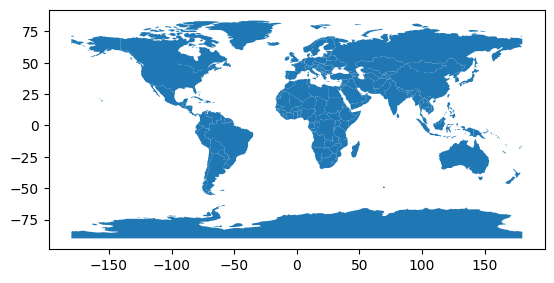

In [60]:
#inspect the simple map

countries_parque.plot()

### **Reading from a Shapefile**


A **Shapefile** is a geospatial vector format introduced by **ESRI** that stores points, lines, or polygons along with attribute data. It consists of multiple related files:

- **`.shp`**: Stores geometry.
- **`.shx`**: Index file for fast access.
- **`.dbf`**: Stores attribute data in tabular format.
- **`.prj`** (optional): Defines the coordinate system (CRS).

When reading a Shapefile with **GeoPandas**, you specify either the folder or only the `.shp` file, but it automatically loads the other files (`.shx`, `.dbf`,`.prj`) if they are in the same directory.

Shapefiles have limitations, including a **2GB file size limit, restricted attribute names, and slower performance on large datasets**. More efficient formats include:  
- **GeoJSON** – Web-friendly, widely used for APIs and mapping applications.  
- **Parquet / Geoparquet** – Optimized for large datasets, better compression, and faster queries.  
- **GeoPackage** – A single-file alternative supported by QGIS and ArcGIS.


In [61]:

# Notice that we did pass a directory path not .shp file path.
# gdp.read_file() automatically detects and reads the shape file in this directory

countries_shp = gpd.read_file("data/ne_110m_admin_0_countries")

# Alternatively, we can read the .shp file directly. If multiple shapefiles
# exist in the same folder (which is poor data management practice), we should
# specify the exact .shp file to read.

# countries = gpd.read_file("data/ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp")

In [62]:
countries_shp.head(3)

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
0,Admin-0 country,1,6,Fiji,FJI,0,2,Sovereign country,1,Fiji,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,...,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,Admin-0 country,1,7,Western Sahara,SAH,0,2,Indeterminate,1,Western Sahara,...,Unrecognized,Unrecognized,Unrecognized,None,None,Unrecognized,None,None,None,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."


### **Reading from a URL**
GeoPandas can also load resources directly from a web URL:

In [63]:
url = "http://d2ad6b4ur7yvpq.cloudfront.net/naturalearth-3.3.0/ne_110m_land.geojson"
countries_web = gpd.read_file(url)
countries_web.head(3)

,scalerank,featureclass,geometry
0,1,Country,"POLYGON ((-59.57209 -80.04018, -59.86585 -80.5..."
1,1,Country,"POLYGON ((-159.20818 -79.49706, -161.1276 -79...."
2,1,Country,"POLYGON ((-45.15476 -78.04707, -43.92083 -78.4..."


### **Reading from a CSV File**  

Often, you may not have a parque or GeoPackage (which are explicitly spatial) but instead a CSV file containing longitude and latitude (X and Y, or Northing, Easting) columns, making it implicitly spatial. To convert it into a GeoDataFrame:  

1. Load the CSV file into a pandas DataFrame.  
2. Identify the column names for longitude and latitude. Ensure you know the coordinate reference system (CRS).  
3. Use `gpd.points_from_xy()` to create a `geometry` column by passing the longitude (x) and latitude (y) columns (order matters).
4. Construct a `GeoDataFrame` using `gpd.GeoDataFrame()`, passing the original DataFrame, the new geometry column, and the CRS.

In [64]:
# 1 - load the csv
df_csv = pd.read_csv('data/Bicycle_Counters_20250301.csv')
# 2 - check the columns
df_csv.columns

Index(['id', 'name', 'domain', 'latitude', 'longitude', 'interval', 'timezone',
       'sens', 'counter'],
      dtype='object')

In [65]:
# 3 - Pass long, lat or x,y in the right order
gdf_geom = gpd.points_from_xy(df_csv['longitude'], df_csv['latitude'])
gdf_geom # this is a geometry array

<GeometryArray>
[<POINT (-74.072 40.643)>, <POINT (-73.863 40.656)>, <POINT (-73.984 40.761)>,
 <POINT (-73.951 40.743)>, <POINT (-73.995 40.715)>, <POINT (-73.961 40.721)>,
 <POINT (-74.001 40.709)>, <POINT (-74.004 40.713)>, <POINT (-73.968 40.711)>,
 <POINT (-73.856 40.858)>, <POINT (-73.971 40.624)>,   <POINT (-73.98 40.74)>,
 <POINT (-73.995 40.716)>,   <POINT (-73.986 40.7)>, <POINT (-73.986 40.762)>,
 <POINT (-73.961 40.711)>, <POINT (-73.975 40.788)>,   <POINT (-73.986 40.7)>,
 <POINT (-73.975 40.788)>,   <POINT (-73.986 40.7)>, <POINT (-73.977 40.739)>,
  <POINT (-73.94 40.751)>,            <POINT (0 0)>, <POINT (-73.971 40.671)>,
 <POINT (-73.852 40.746)>, <POINT (-73.932 40.842)>, <POINT (-73.885 40.828)>,
 <POINT (-73.931 40.584)>, <POINT (-73.924 40.807)>, <POINT (-73.931 40.584)>,
 <POINT (-73.932 40.842)>, <POINT (-73.885 40.828)>, <POINT (-73.885 40.828)>,
 <POINT (-73.932 40.842)>, <POINT (-73.924 40.807)>, <POINT (-74.004 40.712)>,
 <POINT (-73.924 40.807)>, <POINT (-

In [66]:
# 4 - Create the final GeoDataFrame by passing the Pandas df, and the geometry array
gdf_counter = gpd.GeoDataFrame(df_csv, geometry=gdf_geom, crs=4326)
gdf_counter.head(3)

,id,name,domain,latitude,longitude,interval,timezone,sens,counter,geometry
0,100010017,Staten Island Ferry,New York City DOT,40.643387,-74.072075,15,(UTC-05:00) US/Eastern;DST,5,Y2H22104568,POINT (-74.07208 40.64339)
1,300027723,Fountain Ave,New York City DOT,40.655606,-73.862951,15,(UTC-05:00) US/Eastern;DST,5,Y2H22104569,POINT (-73.86295 40.65561)
2,100057318,Broadway at 50th St,New York City DOT,40.761380,-73.984080,15,(UTC-05:00) US/Eastern;DST,5,Y2H18055362,POINT (-73.98408 40.76138)


<div class="alert alert-success">
    
</div>

## **Read a subset of data**
Since **GeoPandas** is powered by **GDAL**, it supports **pre-filtering** when loading large datasets. You can filter data **geospatially** using a **geometry** or **bounding box**, reducing memory usage and load time. Additionally, you can limit the rows loaded using a filter with **slice**.  

### **Geometry filter**

The geometry filter only loads data that intersects with the geometry. Note that the mask and the base GeoDataFrames must have the same `CRS`.
As an example, we want to load the eduaction data for Coney Island.

#### Step 1: **Load NYC Neighborhood Boundaries:**
We start by loading the NYC neighborhood boundaries dataset:

In [67]:
# This dataset contains neighborhood geometries along with additional attributes.
nyc_neighs = gpd.read_parquet('data/nyc_neighborhoods_small.parquet')

<Axes: >

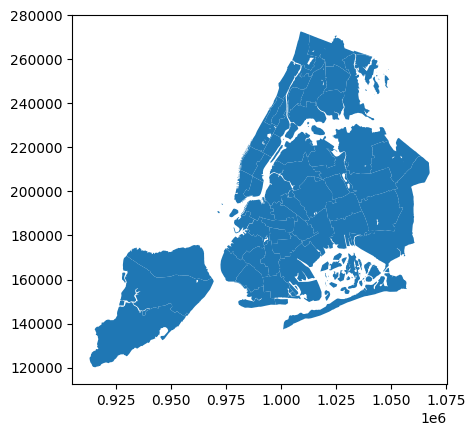

In [68]:
nyc_neighs.plot()

#### Step 2: **Create a Spatial Mask for Coney Island:**

We want to focus on Coney Island, so we create a mask to filter out all other neighborhoods:

In [69]:
# Create a mask to select Coney Island
neigh_mask = nyc_neighs['name'] == "Coney Island"

#### Step 3: **Load NYC Education Data and Apply the Filter**

We now load the NYC education dataset and apply the Coney Island mask:

In [70]:
# load NYC education and mask it by nyc_neighs dataframe where neighborhood name is "Cony Island"
# only load eduation data for coney island
coney_island_ed = gpd.read_file(
    'data/nyc_education.geojson',
    mask=nyc_neighs.loc[neigh_mask]
    )


<Axes: >

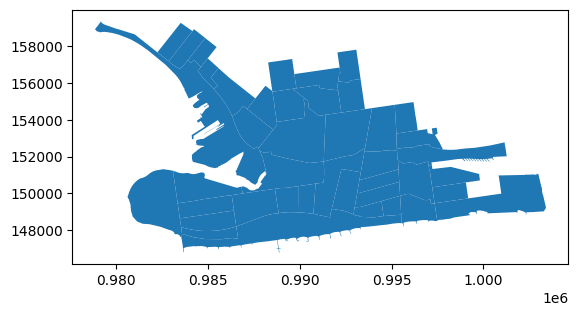

In [71]:
coney_island_ed.plot()

### Geometric operations on `shapely` geometries

Geometries within the geometry column are shapely objects. GeoPandas itself is not creating the object but leverages the existing ecosystem (note that there is a significant overlap of the team writing both packages to ensure synergy).

A typical `GeoDataFrame` contains a single geometry column, as you know from traditional GIS software. If you read it from a file, it will most likely be called `geometry`, but that is not always the case. Furthermore, a `GeoDataFrame` can contain **multiple geometry columns (e.g., one with polygons, another with their centroids and another with bounding boxes)**, of which **only one is considered active**. You can always get this active column, no matter its name, by using `.geometry` property.

In [72]:
coney_island_ed.geometry.loc[:10]

0     POLYGON ((984160.158 158827.22, 983820.851 158...
1     POLYGON ((984854.441 158447.559, 984401.253 15...
2     POLYGON ((985473.748 157957.215, 984988.913 15...
3     POLYGON ((988855.037 148916.004, 988550.605 14...
4     POLYGON ((986417.939 149059.13, 986121.807 149...
5     POLYGON ((986834.014 150357.799, 986887.954 14...
6     POLYGON ((983592.833 147787.154, 983542.065 14...
7     POLYGON ((986543.742 148192.573, 986257.834 14...
8     POLYGON ((993548.682 154578.259, 993291.579 15...
9     POLYGON ((993310.165 156220.621, 993052.912 15...
10    POLYGON ((999767.401 151049.749, 999772.915 15...
Name: geometry, dtype: geometry

In [73]:
coney_island_ed.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US survey foot)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

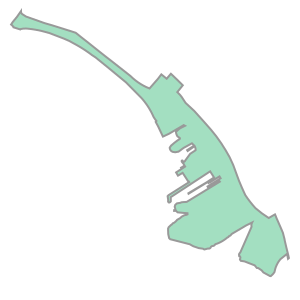

In [74]:
# Closer look at one of the geometries (Polygon here)
long_region = coney_island_ed.loc[23, 'geometry']
long_region

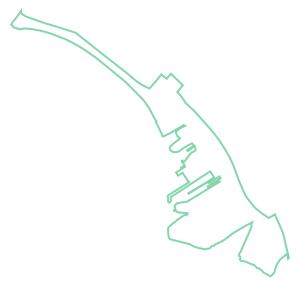

In [75]:
long_region.boundary  # this is no longer a polygon!


In [76]:
print(type(long_region.boundary ))

<class 'shapely.geometry.linestring.LineString'>


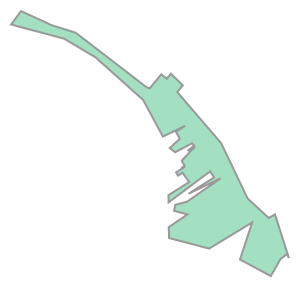

In [77]:
# Simplify the geometry using the `.simplify()` method, which applies the Ramer-Douglas-Peucker (RDP) algorithm.
# A higher tolerance value results in a coarser, more generalized shape.
long_region.simplify(100)


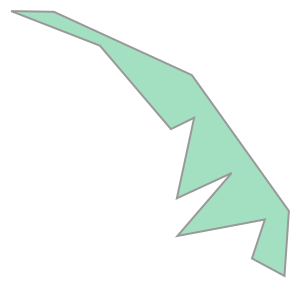

In [78]:
long_region.simplify(600) # The higher the number the coarser the final shape is

In [79]:
# check polygon's area
long_region.area

13053596.955396906

In [80]:
long_region.length # returns the perimeter of the polygon

44711.77483520474

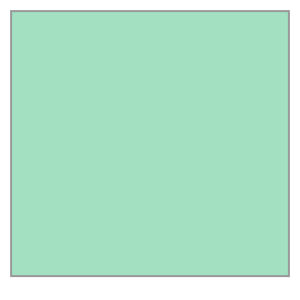

In [81]:
# get the straight bounding box of the polygon
env = long_region.envelope
env

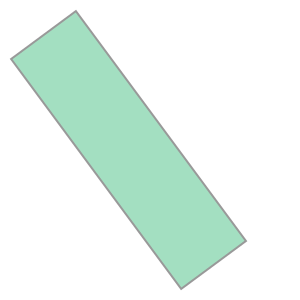

In [82]:
# Compute the minimum rotated rectangle, which provides an efficient bounding box
# that aligns with the object's orientation.

long_region.minimum_rotated_rectangle

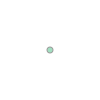

In [83]:
# get the centroid of the envelope
cent = env.centroid
cent

**Buffer the centroid to create an area (useful for spatial joins)**


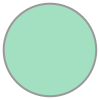

In [84]:
cent.buffer(20) # 20 units in the dataset's CRS (check what that is?)

### Back to reading a subset of data: Bounding box filter

The bounding box filter only loads data that intersects with the bounding box. The bounding box must be in the same CRS as the base database.


In [85]:
# Chosen using google maps copy coordinates

# Step 5: Apply a bounding box filter (ensure CRS consistency)
bbox = (
    -73.99260908088572, 40.74341052862094,  # top-left
    -73.97417702918338, 40.7575719513787   # bottom-right
)


# read the file and filter to the extent of the bounding box
bldg_fpt = gpd.read_file( 'data/manhattan_bldgfp_lower.geojson',
                    bbox = bbox
)

In [86]:
bldg_fpt.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2291 entries, 0 to 2290
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   name        185 non-null    object        
 1   base_bbl    2291 non-null   object        
 2   shape_area  2291 non-null   object        
 3   heightroof  2291 non-null   object        
 4   mpluto_bbl  2291 non-null   object        
 5   cnstrct_yr  2243 non-null   object        
 6   globalid    2291 non-null   object        
 7   lststatype  2288 non-null   object        
 8   feat_code   2291 non-null   object        
 9   groundelev  2289 non-null   object        
 10  geomsource  2291 non-null   object        
 11  bin         2291 non-null   object        
 12  lstmoddate  2291 non-null   datetime64[ms]
 13  doitt_id    2291 non-null   object        
 14  shape_len   2291 non-null   object        
 15  geometry    2291 non-null   geometry      
dtypes: datetime64[ms

### **Now Your Turn**
#### There is an error in the next cell, find and fix it and run again. Write down what the error was.

In [87]:
#Fixing the column datatype
bldg_fpt.heightroof = bldg_fpt.heightroof.astype(float) # typo: variable was spelled incorrectly

<!-- lets visualize our bounding box and see how it overlaps with the clipped data
1. Create a base map (m) based on buildings. tiles="CartoDB Positron specifies which background tiles shall be used, popup=True enables pop-up (shows data on click) and tooltip=False disables tooltip (shows data on hover).

2. Passing m=m ensures that both GeoDataFrames are shown on the same map. -->

## Writing files


To write a GeoDataFrame back to a file, use `GeoDataFrame.to_file()`. The file is format automatically inferred from the suffix, but you can specify your own with the `driver=` keyword. When no suffix is given, GeoPandas expects that you want to create `a folder with an ESRI Shapefile`.

In [88]:
bldg_fpt.to_file('data/bldg_flt.geojson', driver='GeoJSON')

### If you want to write a parquet file, you can use `to_parquet` method

In [89]:
bldg_fpt.to_parquet('data/bldg_flt.parquet')

## Maps in GeoPandas

Maps in GeoPandas are of two kinds. Static images and interactive maps based on `leaflet.js`.



### Static maps

GeoPandas can plot maps to check how the geometries appear in space. Call `GeoDataFrame.plot()` to plot the active geometry. To color code by another column, pass in that column as the first argument.

In the example below, you can plot the active geometry column and color code by the `"heightroof"` column. You may also want to show a legend (`legend=True`).


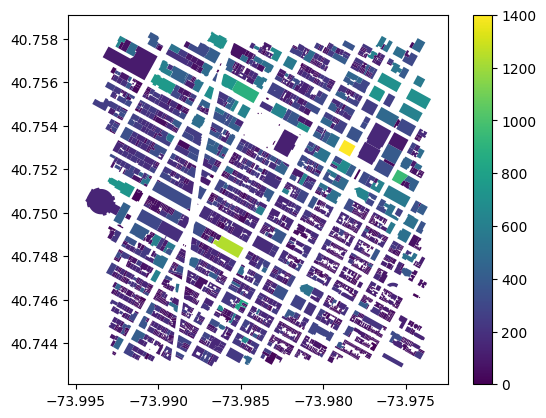

In [90]:
import matplotlib.pyplot as plt
bldg_fpt.plot("heightroof", legend=True)
# Note the legend on the right (1400ft ~ 427m)
# You have the option to save the map as an image
plt.savefig("midtown_building_height.png", dpi=300)

# the tallest building seems to be SUMMIT One Vanderbilt
plt.show()

### Interactive maps

You can also explore your data interactively using `GeoDataFrame.explore()`, which behaves in the same way `.plot()` does but returns an interactive HTML map instead. Specify the basemap by passing its name to the `tiles` argument. Using `popup=True` enbales the on-click attributre display.

In [91]:
# interactive map with CartoDB basemap
bldg_fpt.explore(
    "heightroof",
    tiles="CartoDB Positron",
    tooltip=False,
    popup=True,
    legend=True
    )

### **Now Your Turn:**
#### 1- Why the height of roof is colored like a categorical variable? Why I did not get a continous value in my legend?

#### Check the type of the column, and cast the type to an appropriate type to get a continous legend.



In [92]:
# your code here
# I think it's because it puts values of a scale between min(height) - max(height).
bldg_fpt.heightroof.dtypes

dtype('float64')

#### 2- Try a different base map and change it to `"CartoDB dark_matter"` and draw the map again




In [93]:
# interactive map with CartoDB basemap
bldg_fpt.explore(
    "heightroof",
    tiles="CartoDB dark_matter",
    tooltip=False,
    popup=True,
    legend=True
    )

#### 3- Check the explore() documnetation [here](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.explore.html)

#### experiment with `scheme` and `legend_kwds` and one other parameter of your choice, and explain what you did and how it changed your results.

In [94]:
# your code here

bldg_fpt.explore(
    "heightroof",
    tiles="CartoDB dark_matter",
    tooltip=False,
    popup=True,
    legend=True,
    scheme = "StdMean",
    )

In [95]:
# your code here

bldg_fpt.explore(
    "heightroof",
    tiles="CartoDB dark_matter",
    tooltip=False,
    popup=True,
    legend=True,
    max_labels = 3,
    )

#### **Drawing the centroid of each building footprint**

In [96]:
bldg_fpt.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [97]:
# Ensure the data is in a Projected Coordinate System (PCS) before performing geometric operations.
# Using EPSG:2263 (NAD83 / New York Long Island) for local analysis.
bldg_fpt_2263 = bldg_fpt.to_crs(2263)

# Compute the centroid of each building footprint and visualize by roof height.
bldg_fpt_2263.centroid.explore(tiles="CartoDB Positron", legend=True)



## Spatial Join


#### **We aim to associate the seclected buildings with the neighborhoods based on spatial containment—determining which neighborhood each building falls into.**


#### 1. Create a filter for Manhattan
We want to filter the neighborhood boundaries for Manhattan, and we know that Manhattan sub-boundary codes are between 300 and 400

In [98]:
# filter for Manhattan neighborhoods using borough sub-boundary codes
manh_mask = (nyc_neighs['bor_subb']>300)&(nyc_neighs['bor_subb']<400)
manh_neigh = nyc_neighs.loc[manh_mask].copy()

In [99]:
# cleaning the building footprint gdf and creating a new column with building area in it
# rename the 'name' column in building data to avoid conflicts after merging

bldg_fpt_2263 = bldg_fpt_2263.rename(columns={'name': 'bldg_name'})
bldg_fpt_2263['bldg_area'] = bldg_fpt_2263.area # area is a geopandas method

#### 2. Ensure Consistent Coordinate Reference Systems (CRS)

To perform spatial operations, both datasets must be in the same CRS.

In [100]:
#check if the crs are the same, if not, change one to match the other
if not manh_neigh.crs == bldg_fpt_2263.crs:
    bldg_flt_2263 = bldg_fpt_2263.to_crs(manh_neigh.crs)

#### 3. **Spatial join**: assign buildings to neighborhoods
   
We aim to associate buildings with neighborhoods based on **spatial containment**—determining which neighborhood each building falls into.  

To achieve this, we use **`sjoin()`** with an **`inner` join**, ensuring that we only retain neighborhoods that contain at least one building.  

Since our **target geometry** is the neighborhood boundaries, the **neighborhood GeoDataFrame** should be the **left dataframe** in the spatial join.

This ensures that each neighborhood retains its geometry while acquiring attributes from the building dataset.


In [101]:
# Now, we spatially join buildings to their respective neighborhoods.
# neighberhood on the left to preserve the geometry,
# and building footprint on the right to carry their attributes
merged = manh_neigh.sjoin(bldg_fpt_2263, how='inner')

In [102]:
merged.head()

,bor_subb,name,code,subborough,geometry,index_right,bldg_name,base_bbl,shape_area,heightroof,...,globalid,lststatype,feat_code,groundelev,geomsource,bin,lstmoddate,doitt_id,shape_len,bldg_area
19,303,Chelsea / Clinton / Midtown,303,Chelsea/Clinton/Midtown,"POLYGON ((988299.4 219284.24, 989077.841 21886...",226,None,1008580036,0.0,204.31,...,{7DA19D06-FA7B-4927-8345-21BF042D166E},Constructed,2100,39,Photogramm,1016907,2019-01-22,334342,0.0,6400.122017
19,303,Chelsea / Clinton / Midtown,303,Chelsea/Clinton/Midtown,"POLYGON ((988299.4 219284.24, 989077.841 21886...",1882,None,1008580045,0.0,231.00,...,{D95D0C9E-6067-44C2-91B6-C62DCB3CD73F},Constructed,2100,40,Other (Man,1088542,2019-02-15,1262160,0.0,12690.475814
19,303,Chelsea / Clinton / Midtown,303,Chelsea/Clinton/Midtown,"POLYGON ((988299.4 219284.24, 989077.841 21886...",2224,None,1008590039,0.0,225.87,...,{F110FCFB-F196-40B7-9594-FFA6B7181E14},Constructed,2100,41,Photogramm,1016934,2017-08-22,419330,0.0,8166.385092
19,303,Chelsea / Clinton / Midtown,303,Chelsea/Clinton/Midtown,"POLYGON ((988299.4 219284.24, 989077.841 21886...",472,None,1008590036,0.0,29.55,...,{F5069349-5D4D-4826-BFCC-3590027AE699},Constructed,2100,40,Photogramm,1016933,2017-08-22,110019,0.0,1784.937103
19,303,Chelsea / Clinton / Midtown,303,Chelsea/Clinton/Midtown,"POLYGON ((988299.4 219284.24, 989077.841 21886...",125,None,1008590032,0.0,373.00,...,{CBD7C77A-A4AD-456F-8D3B-678A87D8EB9A},Constructed,2100,40,Other (Man,1087770,2017-08-22,1106106,0.0,5553.230634


#### 4. **Aggregate building statistics per neighborhood**

Now that each building is linked to a neighborhood, we can compute:

- number of buildings in each neighborhood
- minimum, maximum, and average building area

In [103]:
# aggregate building data per neighborhood - This is the same process that we saw in pandas
neighborhood_stats = (
    merged.groupby('name')
    .agg(
        building_count=('globalid', 'count'),  # number of buildings
        min_area=('bldg_area', 'min'),           # smallest building area
        max_area=('bldg_area', 'max'),           # largest building area
        mean_area=('bldg_area', 'mean')          # average building area
    )
    .reset_index()
)

#### 5. **Merge back to GeoDataFrame**: At this point, `neighborhood_stats` is a `pandas DataFrame`, meaning it has lost its spatial properties.

To visualize results, we merge it back with manh_neigh and convert it back into a `GeoDataFrame`.

In [104]:
type(neighborhood_stats)

pandas.core.frame.DataFrame

In [105]:
# merge back with neighborhood geometries
neighborhood_stats = neighborhood_stats.merge(manh_neigh, on='name', how='inner')

# now that we have a geometry column, we can set that as the geometry column to convert neighborhood stats into GeoDataFrame
neighborhood_gdf = neighborhood_stats.set_geometry('geometry')
print(type(neighborhood_stats))

# Alternatively we can convert back to a GeoDataFrame using GeoDataFrame constructor
# neighborhood_stats = gpd.GeoDataFrame(neighborhood_stats, geometry='geometry', crs=manh_neigh.crs)

## if you run this cell twice in a row, you will get an error! why? (inspect the name of the columns that are created! caveats of using jpyter)
# we get an error because we overwrite 'neighborhood_stats' and therefore cannot perform the same merge again

<class 'pandas.core.frame.DataFrame'>


#### 6. **visualizing the data**

Now, we create an interactive map showing:

neighborhood-level building statistics
individual buildings, colored by height

In [106]:
m = neighborhood_gdf.explore(tiles="CartoDB Positron", legend=True)
bldg_fpt.explore("heightroof", m=m, tiles="CartoDB Positron", legend=True)